In [1]:
# import packages
using Printf
using Plots 

In [2]:
# set fitness of genotype AA
W_AA = 0.85

0.85

In [3]:
# set fitness of genotype Aa
W_Aa = 0.85

0.85

In [4]:
# set fitness of genotype aa
W_aa = 1.

1.0

In [5]:
# set initial frequency of allele A
p₀ = 0.76

0.76

In [6]:
# calculate initial frequency of allele a
q₀ = 1 - p₀

0.24

In [7]:
# calculate initial mean fitness
w̄₀ = p₀^2*W_AA + 2p₀*q₀*W_Aa + q₀^2*W_aa

0.85864

In [8]:
# calculate initial frequency of genotype AA
f_AA₀ = p₀^2*W_AA/w̄₀

0.5717879437249604

In [9]:
# calculate initial frequency of genotype Aa
f_Aa₀ = 2p₀*q₀*W_Aa/w̄₀

0.3611292276157645

In [10]:
# calculate initial frequency of genotype aa
f_aa₀ = q₀^2/w̄₀

0.06708282865927513

In [11]:
# set maximum number of generations
max_G = 50

50

In [12]:
# initialize saving space 
p = zeros(Float64,max_G+1)
q = zeros(Float64,max_G+1)
w̄ = zeros(Float64,max_G+1)
f_AA = zeros(Float64,max_G+1)
f_Aa = zeros(Float64,max_G+1)
f_aa = zeros(Float64,max_G+1)
# set initial conditions
p[1] = p₀
q[1] = q₀
w̄[1] = w̄₀
f_AA[1] = f_AA₀
f_Aa[1] = f_Aa₀
f_aa[1] = f_aa₀

0.06708282865927513

In [13]:
# display initial condidtions 
@printf "Generation %4.0f:  p=%.4f q=%.4f f_AA=%.4f f_Aa=%.4f f_aa=%.4f w̄=%.4f\n" 0 p[1] q[1] f_AA[1] f_Aa[1] f_aa[1] w̄[1]
for g in 2:max_G+1
    
    # update p 
    p[g] = (p[g-1]^2*W_AA + p[g-1]*q[g-1]*W_Aa)/w̄[g-1] 
    # update q
    q[g] = 1 - p[g]
    # update w̄
    w̄[g] = p[g]^2*W_AA + 2p[g]*q[g]*W_Aa + q[g]^2*W_aa
    # update frequency of genotype Aa
    f_AA[g] = p[g]^2*W_AA/w̄[g]
    # update frequency of genotype Aa
    f_Aa[g] = 2p[g]*q[g]*W_Aa/w̄[g]
    # update frequency of genotype Aa
    f_aa[g] = q[g]^2*W_aa/w̄[g]
    
    # display results of each iteration 
    @printf "Generation %4.0f:  p=%.4f q=%.4f f_AA=%.4f f_Aa=%.4f f_aa=%.4f w̄=%.4f\n" g-1 p[g] q[g] f_AA[g] f_Aa[g] f_aa[g] w̄[g]
    
end

Generation    0:  p=0.7600 q=0.2400 f_AA=0.5718 f_Aa=0.3611 f_aa=0.0671 w̄=0.8586
Generation    1:  p=0.7524 q=0.2476 f_AA=0.5600 f_Aa=0.3686 f_aa=0.0714 w̄=0.8592
Generation    2:  p=0.7443 q=0.2557 f_AA=0.5477 f_Aa=0.3763 f_aa=0.0760 w̄=0.8598
Generation    3:  p=0.7358 q=0.2642 f_AA=0.5348 f_Aa=0.3841 f_aa=0.0811 w̄=0.8605
Generation    4:  p=0.7269 q=0.2731 f_AA=0.5215 f_Aa=0.3919 f_aa=0.0866 w̄=0.8612
Generation    5:  p=0.7174 q=0.2826 f_AA=0.5075 f_Aa=0.3998 f_aa=0.0926 w̄=0.8620
Generation    6:  p=0.7074 q=0.2926 f_AA=0.4930 f_Aa=0.4078 f_aa=0.0992 w̄=0.8628
Generation    7:  p=0.6969 q=0.3031 f_AA=0.4779 f_Aa=0.4157 f_aa=0.1063 w̄=0.8638
Generation    8:  p=0.6858 q=0.3142 f_AA=0.4623 f_Aa=0.4236 f_aa=0.1142 w̄=0.8648
Generation    9:  p=0.6741 q=0.3259 f_AA=0.4460 f_Aa=0.4313 f_aa=0.1227 w̄=0.8659
Generation   10:  p=0.6616 q=0.3384 f_AA=0.4291 f_Aa=0.4389 f_aa=0.1320 w̄=0.8672
Generation   11:  p=0.6485 q=0.3515 f_AA=0.4116 f_Aa=0.4461 f_aa=0.1422 w̄=0.8685
Generation   12:

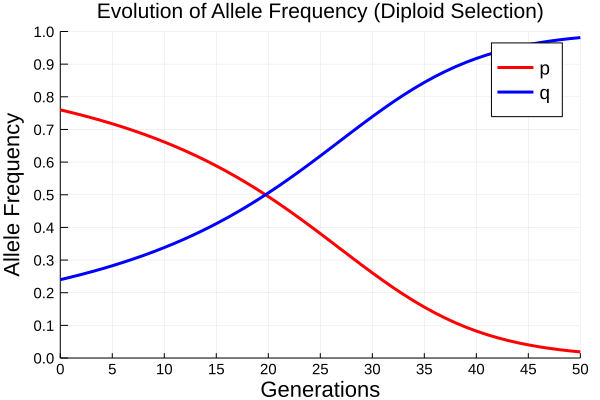

In [14]:
# visualize resutls of allele frequency
# plot p vs generations
plot(0:max_G,p,title= "Evolution of Allele Frequency (Diploid Selection)",
        xlabel = "Generations",
        ylabel = "Allele Frequency",
        xlims = (0,max_G),
        ylims = (0,1),
        xticks = 0:5:max_G,
        yticks = 0:0.1:1.,
        label = "p",
        lw=3,
        linecolor = :red,
        legend = :topright,
        guidefont = font(15, "Aerial"),
        legendfont = font(13, "Aerial"),
        xtickfont = font(10, "Aerial"),
        ytickfont = font(10, "Aerial"))
# plot q vs generations
plot!(0:max_G,q,
        lw=3,
        linecolor = :blue,
        label = "q")

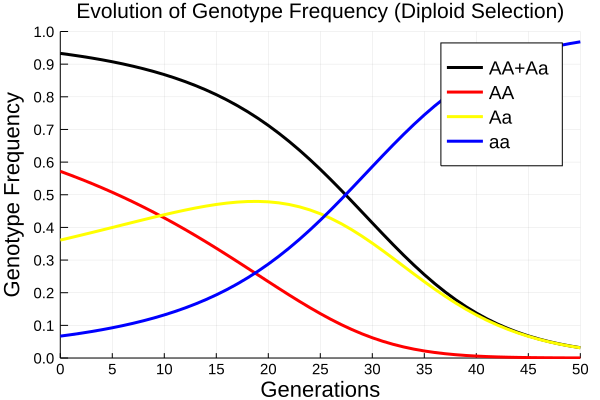

In [15]:
# visualize resutls of genotype frequency
# plot f_AA vs generations
plot(0:max_G,f_AA+f_Aa,title= "Evolution of Genotype Frequency (Diploid Selection)",
        xlabel = "Generations",
        ylabel = "Genotype Frequency",
        xlims = (0,max_G),
        ylims = (0,1),
        xticks = 0:5:max_G,
        yticks = 0:0.1:1.,
        label = "AA+Aa",
        lw=3,
        linecolor = :black,
        legend = :topright,
        guidefont = font(15, "Aerial"),
        legendfont = font(13, "Aerial"),
        xtickfont = font(10, "Aerial"),
        ytickfont = font(10, "Aerial"))
# plot f_Aa vs generations
plot!(0:max_G,f_AA,
        lw=3,
        linecolor = :red,
        label = "AA")
# plot f_Aa vs generations
plot!(0:max_G,f_Aa,
        lw=3,
        linecolor = :yellow,
        label = "Aa")
# plot f_aa vs generations
plot!(0:max_G,f_aa,
        lw=3,
        linecolor = :blue,
        label = "aa")

In [ ]:
## Complete Code ##
# import packages
using Printf
using Plots 

# set fitness of genotype AA
W_AA = 0.85

# set fitness of genotype Aa
W_Aa = 0.85

# set fitness of genotype aa
W_aa = 1.

# set initial frequency of allele A
p₀ = 0.76

# calculate initial frequency of allele a
q₀ = 1 - p₀

# calculate initial mean fitness
w̄₀ = p₀^2*W_AA + 2p₀*q₀*W_Aa + q₀^2*W_aa

# calculate initial frequency of genotype AA
f_AA₀ = p₀^2*W_AA/w̄₀

# calculate initial frequency of genotype Aa
f_Aa₀ = 2p₀*q₀*W_Aa/w̄₀

# calculate initial frequency of genotype aa
f_aa₀ = q₀^2/w̄₀

# set maximum number of generations
max_G = 50

# initialize saving space 
p = zeros(Float64,max_G+1)
q = zeros(Float64,max_G+1)
w̄ = zeros(Float64,max_G+1)
f_AA = zeros(Float64,max_G+1)
f_Aa = zeros(Float64,max_G+1)
f_aa = zeros(Float64,max_G+1)
# set initial conditions
p[1] = p₀
q[1] = q₀
w̄[1] = w̄₀
f_AA[1] = f_AA₀
f_Aa[1] = f_Aa₀
f_aa[1] = f_aa₀

# display initial condidtions 
@printf "Generation %4.0f:  p=%.4f q=%.4f f_AA=%.4f f_Aa=%.4f f_aa=%.4f w̄=%.4f\n" 0 p[1] q[1] f_AA[1] f_Aa[1] f_aa[1] w̄[1]
for g in 2:max_G+1
    
    # update p 
    p[g] = (p[g-1]^2*W_AA + p[g-1]*q[g-1]*W_Aa)/w̄[g-1] 
    # update q
    q[g] = 1 - p[g]
    # update w̄
    w̄[g] = p[g]^2*W_AA + 2p[g]*q[g]*W_Aa + q[g]^2*W_aa
    # update frequency of genotype Aa
    f_AA[g] = p[g]^2*W_AA/w̄[g]
    # update frequency of genotype Aa
    f_Aa[g] = 2p[g]*q[g]*W_Aa/w̄[g]
    # update frequency of genotype Aa
    f_aa[g] = q[g]^2*W_aa/w̄[g]
    
    # display results of each iteration 
    @printf "Generation %4.0f:  p=%.4f q=%.4f f_AA=%.4f f_Aa=%.4f f_aa=%.4f w̄=%.4f\n" g-1 p[g] q[g] f_AA[g] f_Aa[g] f_aa[g] w̄[g]
    
end

# visualize resutls of allele frequency
# plot p vs generations
plot(0:max_G,p,title= "Evolution of Allele Frequency (Diploid Selection)",
        xlabel = "Generations",
        ylabel = "Allele Frequency",
        xlims = (0,max_G),
        ylims = (0,1),
        xticks = 0:5:max_G,
        yticks = 0:0.1:1.,
        label = "p",
        lw=3,
        linecolor = :red,
        legend = :topright,
        guidefont = font(15, "Aerial"),
        legendfont = font(13, "Aerial"),
        xtickfont = font(10, "Aerial"),
        ytickfont = font(10, "Aerial"))
# plot q vs generations
plot!(0:max_G,q,
        lw=3,
        linecolor = :blue,
        label = "q")

# visualize resutls of genotype frequency
# plot f_AA vs generations
plot(0:max_G,f_AA+f_Aa,title= "Evolution of Genotype Frequency (Diploid Selection)",
        xlabel = "Generations",
        ylabel = "Genotype Frequency",
        xlims = (0,max_G),
        ylims = (0,1),
        xticks = 0:5:max_G,
        yticks = 0:0.1:1.,
        label = "AA+Aa",
        lw=3,
        linecolor = :black,
        legend = :topright,
        guidefont = font(15, "Aerial"),
        legendfont = font(13, "Aerial"),
        xtickfont = font(10, "Aerial"),
        ytickfont = font(10, "Aerial"))
# plot f_Aa vs generations
plot!(0:max_G,f_AA,
        lw=3,
        linecolor = :red,
        label = "AA")
# plot f_Aa vs generations
plot!(0:max_G,f_Aa,
        lw=3,
        linecolor = :yellow,
        label = "Aa")
# plot f_aa vs generations
plot!(0:max_G,f_aa,
        lw=3,
        linecolor = :blue,
        label = "aa")